In [1]:
import pandas as pd
import scanpy as sc 
import numpy as np

import matplotlib.pyplot as plt
from matplotlib import rcParams
import os,re


In [2]:
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
warnings.filterwarnings('ignore', 'No data for colormapping provided via', UserWarning)

In [3]:
os.chdir("/home/maolp/data5/Gaofeng_All_matrix/Allcount/All_scanpyData")

In [4]:
plt.style.use('default')
plt.rcParams['figure.figsize'] = [4, 4]
plt.rcParams['figure.dpi'] = 300

In [5]:
adata1=sc.read_h5ad('Data/Scanpy_merge_rmdoubulet_UMAP_label_lastCell.h5ad')

In [6]:
import pandas as pd

count_df3 = adata1.obs.groupby(['AdjustedID', 'Last_cell_type']).size().reset_index(name='counts')

pivot_df = count_df3.pivot(index='AdjustedID', columns='Last_cell_type', values='counts')

pivot_df = pivot_df.fillna(0)

pivot_df.T


AdjustedID,S24.6_P11,S18.6_P5,L24.6_P11,L18.6_P5,L10.0_P1,L10.1_P25,T24.6_P11,T18.6_P5,T10.0_P1,T10.1_P25,...,B23.4_P10,B18.0_P4,B36.1_P19,B30.4_P14,B21.7_P8,B39.1_P22,B33.3_P17,B18.6_P5,B22.4_P23,B11.6_P24
Last_cell_type,,,,,,,,,,,,,,,,,,,,,
CD14+PPBP+ Monocytes,0,0,0,0,0,0,0,0,0,0,...,14,102,8,43,103,27,9,9,1,17
CD56highCD16low NK,124,74,179,209,65,163,5,18,10,4,...,16,114,15,69,35,20,1,58,2,70
CX3CR1+ NK,244,605,222,187,45,152,15,40,55,11,...,307,220,896,720,523,501,213,1476,301,1497
CXCR5+ Naïve B,5187,4186,448,353,7,54,86,115,6,3,...,825,958,583,1193,642,976,1026,1198,987,682
CXCR5- Naïve B,128,201,1812,1077,31,400,8,12,4,5,...,307,331,50,200,130,107,19,971,256,332
CXCR6+ NK,536,677,1004,1367,303,2489,4,53,29,19,...,8,6,18,8,373,2,0,251,12,95
Classical Monocytes,106,133,535,127,68,227,39,18,24,15,...,674,769,2641,790,2105,1701,907,745,776,747
Cycling Treg,0,0,0,0,0,0,0,26,0,0,...,0,5,0,0,1,0,3,0,3,13
DC1,19,45,20,27,4,11,133,108,107,17,...,0,1,3,3,3,4,0,0,0,1


In [7]:
mkdir -p /home/maolp/data5/Gaofeng_All_matrix/Allcount/All_scanpyData/Count/

In [8]:
pivot_df.T.to_csv('/home/maolp/data5/Gaofeng_All_matrix/Allcount/All_scanpyData/Count/All_cell20231205.csv')

In [9]:
adataPBMC=adata1[adata1.obs['New_Body'].isin(['PBMC'])]

In [10]:
 progenitor_gene={'HSC_MPP':['CLEC9A','HLF','CD34','SPINK2'],
           'MLP':['BCL11A','IL7R','IL2RG'],
           'B lineage':['CD19','VPREB1','PAX5'],
           'T lineage':['CD3D','BCL11B'],
           'MEMP':['GATA2'],
           'MEP':['KLF1','ITGA2B'],
           'Ery lineage':['HBB','HBG1'],
           'Myeloid lineage':['MPO','CSF1R','CEBPA'],
                  'Cycling':['MKI67']
          }
# sc.pl.dotplot(sub23,progenitor_gene, '23')

In [11]:
MEGA_ER_markers = {"Megakaryocyte Erythroid Precursors":['TESPA1','GATA2','FCER1A'],
"Early_ERY":['KLF1','APOE','FAM178B'],
"Mid_ERY":[ 'BLVRB', 'CD36', 'OAT',],
"Late_ERY":[ 'GYPA', 'GYPB', 'SLC4A1'],
"YS_ERY" : ['HBZ','HBE1'],
"Early_MK":['HBD','PF4'],
"late_MK":['ITGA2B','ITGB3','CLK1'],
'MACROPHAGE_ERY':["C1QA","CD163"],
"Proliferating" : ["TOP2A","MKI67"],
          }


In [12]:
Myeloid_markers={'Early Progenitor': ['CD34', 'SPINK2', 'MLLT3'],
 'Myeloid_progenitor': ['PRSS57', 'PRTN3', 'AZU1'],
 'Neutrophil lineage': ['ELANE', 'DEFA4', 'LCN2', 'LTF', 'ORM1'],
 'Monocyte_lineage': ['CD52', 'S100A8', 'MS4A6A','CD14', 'CXCR4', 'CCR2', 'IL1B', 'CD300E'],
 'DC progenitor': ['ACY3', 'TIFAB', 'KIF17'],
 'pDC': ['CLEC4C', 'JCHAIN', 'IRF7'],
 'DC2': ['CLEC10A', 'CD1C'],
 'DC1': ['CLEC9A', 'BATF3'],
 'MIGRATORY DC': ['CCR7', 'LAMP3'],
 'MAST': ['CLC', 'KIT', 'TPSAB1'],
 'Monocytes-MK like': ['HBD','PF4'],
 'Monocytes-CD177': ['CD177'],
 'Monocytes-NKG7': ['NKG7'],
}

In [13]:
MEGA_ER_markers = {"Megakaryocyte Erythroid Precursors":['TESPA1','GATA2','FCER1A'],
"Early_ERY":['KLF1','APOE','FAM178B'],
"Mid_ERY":[ 'BLVRB', 'CD36', 'OAT',],
"Late_ERY":[ 'GYPA', 'GYPB', 'SLC4A1'],
"YS_ERY" : ['HBZ','HBE1'],
"Early_MK":['HBD','PF4'],
"late_MK":['ITGA2B','ITGB3','CLK1'],
'MACROPHAGE_ERY':["C1QA","CD163"],
"Proliferating" : ["TOP2A","MKI67"],
          }


In [14]:
Allmarker_genes_dict2={
    'Immue':'PTPRC',
    'HSC': ['CYTL1', 'GATA2', 'CD34', 'KIT'],
    
    'T-cell': ['CD3D', 'CD3E', 'CD3G', 'CD4', 'CD8A'],

    'CD8_TN': ['CCR7','LEF1', 'SELL', 'TCF7', 'CD27', 'CD28', 'S1PR1'],
    'CD8_TCM': ['CCR7', 'SELL', 'IL7R', 'CD27', 'CD28', 'PRF1', 'GZMA', 'CCL5', 'GPR183', 'S1PR1'],
    'CD8_TEMRA_TEFF': ['KLRG1', 'CX3CR1', 'FCGR3A', 'FGFBP2', 'PRF1', 'GZMH', 'TBX21', 'EOMES', 'S1PR1', 'S1PR5'],
    'CD8_TEM': ['GZMK', 'CXCR4', 'CXCR3', 'CD44'],
    'CD8_TRM': ['CD6', 'XCL1', 'XCL2', 'MYADM', 'CAPG', 'RORA', 'NR4A1','NR4A2','NR4A3', 'CD69', 'ITGAE'],
    'CD8_IEL': ['CD160', 'KIR2DL4', 'TMIGD2', 'KLRC1','KLRC2','KLRC3', 'NR4A1','NR4A2','NR4A3', 'IKZF2', 'ENTPD1', 'CD69', 'ITGAE'],
    'CD8_TEX': ['HAVCR2', 'CXCL13', 'PDCD1', 'LAYN', 'TOX', 'IFNG', 'GZMB', 'MIR155HG', 'TNFRSF9', 'ITGAE'],
    'MAIT': ['SLC4A10', 'KLRB1', 'ZBTB16', 'NCR3', 'RORC', 'RORA'],

    'CD4-TN': ['CCR7', 'LEF1', 'SELL', 'TCF7', 'CD27', 'CD28', 'S1PR1'],
    'CD4Blood-TCM': ['CCR7', 'SELL', 'PTGER2', 'ICAM2', 'ANXA1', 'ANXA2', 'S1PR1'],
    'CD4TEMRNTEFF': ['KLRG1', 'CX3CR1', 'NKG7', 'PRF1', 'GNLY', 'GZMH', 'TBX21', 'CTSW', 'S1PR1', 'S1PR5'],
    'CD4-Normal-TcM': ['CCR7', 'TCF7', 'RGS1', 'CD69'],
    'CD4TRM': ['CD69', 'KLRB1', 'PTGER4', 'IL7R', 'CXCR6', 'NR4A1/2/3', 'MYADM'],
    'TFH': ['CXCR5', 'BCL6', 'ICA1', 'TOX', 'TOX2', 'IL6ST', 'MAGEH1', 'BTLA', 'ICOS', 'PDCD1', 'CD200'],
    'CD4TEM/TH1-like': ['GZMK', 'GZMA', 'CCL5', 'IFNG', 'RUNX3', 'EOMES', 'CXCR3', 'CXCR4', 'CD44'],
    'TH17': ['IL23R', 'RORC', 'IL17A', 'FURIN', 'CTSH', 'CCR6', 'KLRB1', 'CAPG', 'ITGAE'],
    'TH1-like T cells': ['CXCL13', 'IFNG', 'CXCR3', 'BHLHE40', 'GZMB', 'PDCD1', 'HAVCR2', 'ICOS', 'IGFLR1', 'ITGAE'],
    'Blood-Treg': ['FOXP3', 'IL2RA', 'IL10RA', 'IKZF2', 'RTKN2', 'CDC25B', 'S1PR4'],
    'TFR': ['FOXP3', 'IL2RA', 'CXCR5', 'PDCD1', 'IL10', 'CCR4', 'CD69'],
    'Tumour-Treg': ['FOXP3', 'CCR8', 'TNFRSF18', 'LAYN', 'TNFRSF9', 'IKZF2', 'RTKN2', 'CTLA4', 'BATF', 'IL21R'],

    'B-cell': ['CD79A', 'CD79B', 'CD19', 'MS4A1'],
    'Naive B cell': ['CD19', 'MS4A1', 'IGHD', 'IGHM', 'IL4R', 'TCL1A'],
    'Memory B cell': ['CD27', 'CD38', 'IGHG1'],

    'Plasma_B': ['MZB1', 'SDC1', 'JCHAIN', 'XBP1'],
    'NK-cell': ['KLRF1', 'NCAM1', 'NCR1', 'GNLY', 'NKG7', 'FCGR3A'],
    'NK1': ['NCAM1', 'GNLY', 'NKG7'],
    'NK2': ['FCGR3A','KLRF1'],
    'Myeloid': ['LYZ', 'CD68', 'MS4A6A', 'CD1E', 'IL3RA', 'LAMP3'],
    'Macrophages': ['CSF1R', 'CD68', 'CD163', 'CD14'],
    'Monocytes': ['S100A8', 'S100A9', 'CD68', 'LYZ'],
    'CD14_Mono': ['CD14', 'LYZ'],
    'CD16_Mono': ['LYZ', 'FCGR3A'],
    'Dendritic': ['IL3RA', 'THBD', 'CD1C', 'CD68', 'CD83', 'FCER1A', 'CST3'],
    'mDC': ['CD1C', 'FCER1A'],
    'pDC': ['KLRD1', 'LILRA4', 'CLEC4C', 'IL3RA'],
    'Neutrophil': ['FCGR3B', 'CXCR2'],
    'Mast': ['TPSAB1', 'KIT', 'CPA3', 'ENPP3'],
    'Platelets': ['PPBP', 'GP9'],
    'Erythrocyte': ['HBA1', 'HBD', 'GYPA']
}


In [15]:

Allmarker_genes_dict2={
    'Immue':'PTPRC',
    'HSC': ['CYTL1', 'GATA2', 'CD34', 'KIT'],
    
    'T-cell': ['CD3D', 'CD3E', 'CD3G', 'CD4', 'CD8A'],



    'B-cell': ['CD79A', 'CD79B', 'CD19', 'MS4A1'],
    'Naive B cell': ['CD19', 'MS4A1', 'IGHD', 'IGHM', 'IL4R', 'TCL1A'],
    'Memory B cell': ['CD27', 'CD38', 'IGHG1'],

    'Plasma_B': ['MZB1', 'SDC1', 'JCHAIN', 'XBP1'],
    'NK-cell': ['KLRF1', 'NCAM1', 'NCR1', 'GNLY', 'NKG7', 'FCGR3A'],
    'NK1': ['NCAM1', 'GNLY', 'NKG7'],
    'NK2': ['FCGR3A','KLRF1'],
    'Myeloid': ['LYZ', 'CD68', 'MS4A6A', 'CD1E', 'IL3RA', 'LAMP3'],
    'Macrophages': ['CSF1R', 'CD68', 'CD163', 'CD14'],
    'Monocytes': ['S100A8', 'S100A9', 'CD68', 'LYZ'],
    'CD14_Mono': ['CD14', 'LYZ'],
    'CD16_Mono': ['LYZ', 'FCGR3A'],
    'Dendritic': ['IL3RA', 'THBD', 'CD1C', 'CD68', 'CD83', 'FCER1A', 'CST3'],
    'mDC': ['CD1C', 'FCER1A'],
    'pDC': ['KLRD1', 'LILRA4', 'CLEC4C', 'IL3RA'],
    'Neutrophil': ['FCGR3B', 'CXCR2'],
    'Mast': ['TPSAB1', 'KIT', 'CPA3', 'ENPP3'],
    'Platelets': ['PPBP', 'GP9'],
    'Erythrocyte': ['HBA1', 'HBD', 'GYPA']
}


In [16]:

Allmarker_genes_dict3={
    'Immue':'PTPRC',

    'Myeloid': ['LYZ', 'CD68', 'MS4A6A', 'CD1E', 'IL3RA', 'LAMP3'],
    'Macrophages': ['CSF1R', 'CD68', 'CD163', 'CD14'],
    'Monocytes': ['S100A8', 'S100A9', 'CD68', 'LYZ'],
    'CD14_Mono': ['CD14', 'LYZ'],
    'CD16_Mono': ['LYZ', 'FCGR3A'],
    'Dendritic': ['IL3RA', 'THBD', 'CD1C', 'CD68', 'CD83', 'FCER1A', 'CST3'],
    'mDC': ['CD1C', 'FCER1A'],
    'pDC': ['KLRD1', 'LILRA4', 'CLEC4C', 'IL3RA'],
    'Neutrophil': ['FCGR3B', 'CXCR2'],
    'Mast': ['TPSAB1', 'KIT', 'CPA3', 'ENPP3'],
    'Platelets': ['PPBP', 'GP9'],
    'Erythrocyte': ['HBA1', 'HBD', 'GYPA']
}


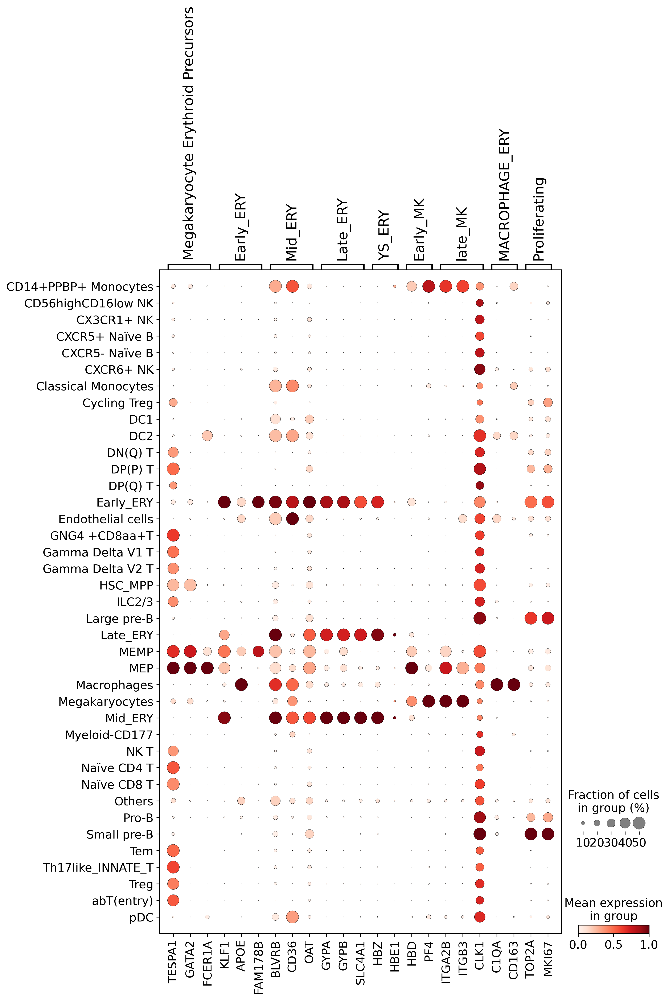

In [17]:

custom_fontsize = 16


custom_rc = {
    'font.size': custom_fontsize,
    'axes.titlesize': custom_fontsize,
    'axes.labelsize': custom_fontsize,
    'xtick.labelsize': custom_fontsize,
    'ytick.labelsize': custom_fontsize,
}


with plt.rc_context(rc=custom_rc):

    sc.pl.dotplot(adata1 ,MEGA_ER_markers,'Last_cell_type',dot_max=0.5,standard_scale='var')

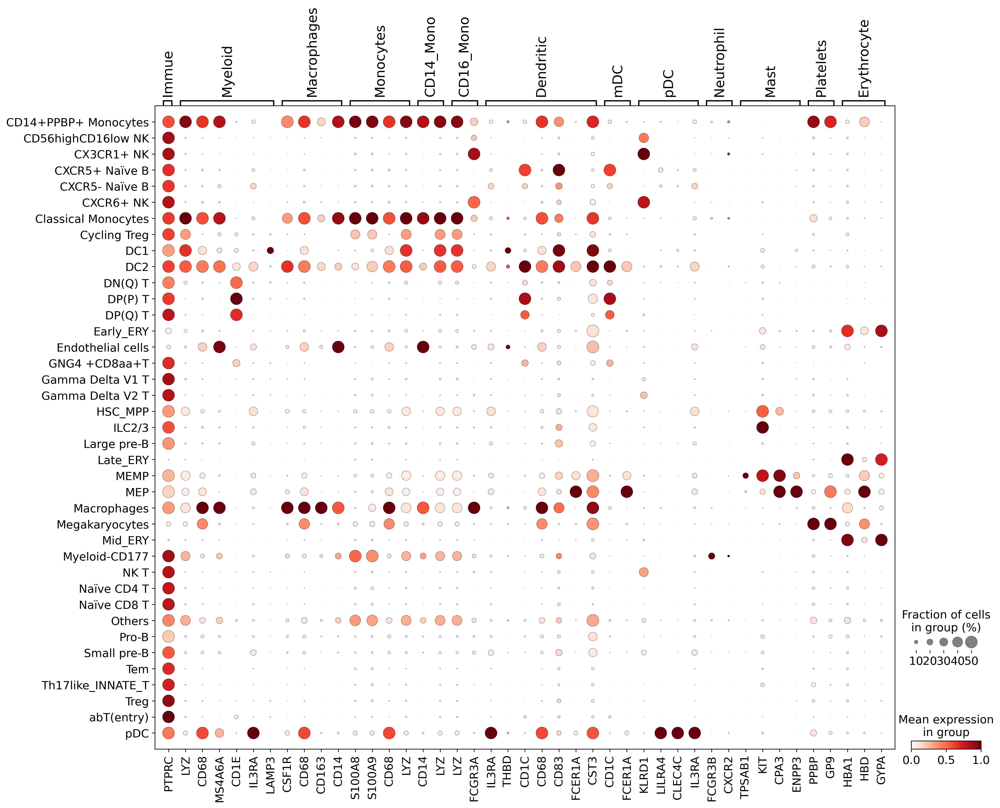

In [18]:

custom_fontsize = 16


custom_rc = {
    'font.size': custom_fontsize,
    'axes.titlesize': custom_fontsize,
    'axes.labelsize': custom_fontsize,
    'xtick.labelsize': custom_fontsize,
    'ytick.labelsize': custom_fontsize,
}


with plt.rc_context(rc=custom_rc):

    sc.pl.dotplot(adata1 ,Allmarker_genes_dict3,'Last_cell_type',dot_max=0.5,standard_scale='var')

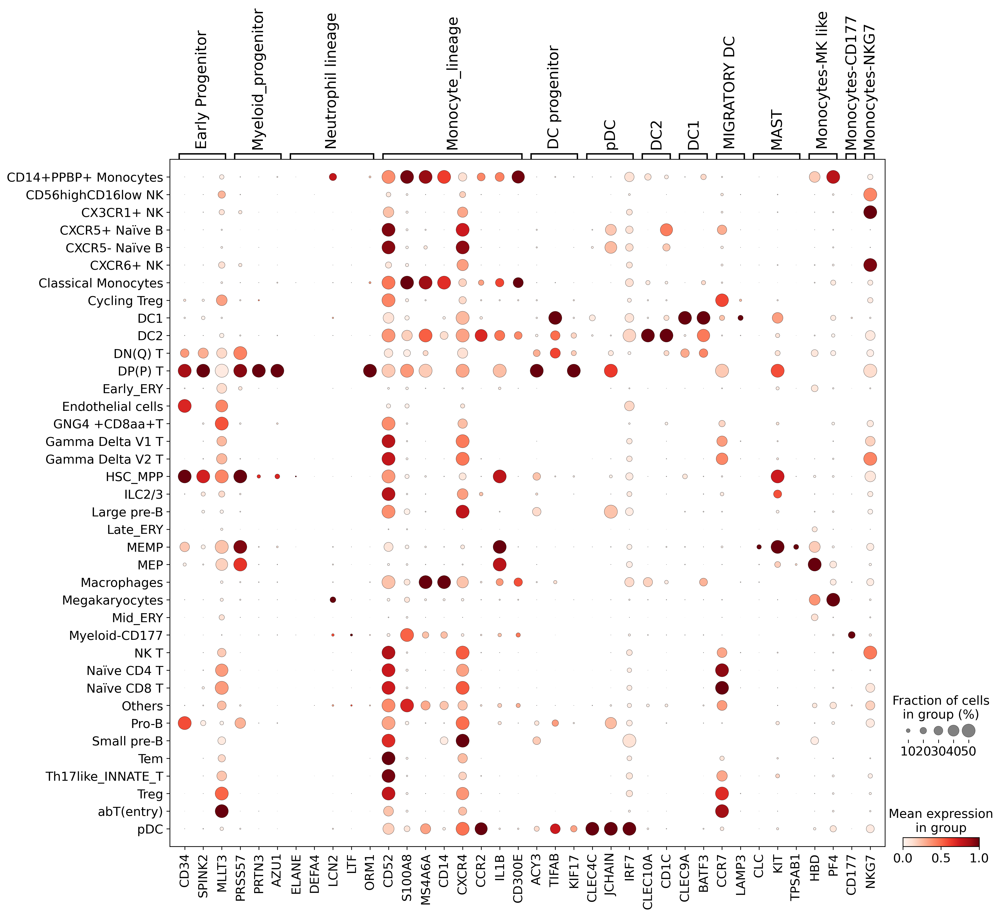

In [19]:

custom_fontsize = 16


custom_rc = {
    'font.size': custom_fontsize,
    'axes.titlesize': custom_fontsize,
    'axes.labelsize': custom_fontsize,
    'xtick.labelsize': custom_fontsize,
    'ytick.labelsize': custom_fontsize,
}


with plt.rc_context(rc=custom_rc):

    sc.pl.dotplot(adataPBMC ,Myeloid_markers,'Last_cell_type',dot_max=0.5,standard_scale='var')

In [20]:
adataPBMC=adata1[adata1.obs['New_Body'].isin(['PBMC'])]

In [21]:
adataPBMC.obs['Last_cell_type'].value_counts()

Naïve CD4 T             37021
Classical Monocytes     29553
Late_ERY                27655
CXCR5+ Naïve B          16369
Naïve CD8 T             13184
CX3CR1+ NK              11965
Mid_ERY                  6464
CXCR5- Naïve B           4705
Megakaryocytes           3805
Treg                     3490
HSC_MPP                  2709
Th17like_INNATE_T        1955
MEMP                     1685
Early_ERY                1665
Myeloid-CD177            1471
abT(entry)               1359
DC2                      1309
Gamma Delta V2 T         1024
CXCR6+ NK                1002
MEP                       945
NK T                      892
CD14+PPBP+ Monocytes      810
CD56highCD16low NK        633
pDC                       623
Others                    541
Tem                       425
Gamma Delta V1 T          307
ILC2/3                    208
Pro-B                     148
Macrophages                86
Large pre-B                60
Cycling Treg               39
DC1                        34
GNG4 +CD8a

In [22]:
adata1

AnnData object with n_obs × n_vars = 248851 × 31424
    obs: 'Name', 'doublet_scores', 'predicted_doublets', 'predicted_labels', 'over_clustering', 'majority_voting', 'conf_score', 'Cellname', 'AdjustedID', 'New_Body', 'Week', 'TCRBCRlabel', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'Last_cell_type', 'Cell_lineage', 'Last_cell_type2', 'Last_cell_type_num', 'Last_cell_type_num2'
    var: 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'AdjustedID_colors', 'Cell_lineage_colors', 'Last_cell_type_colors', 'Last_cell_type_num_colors', 'New_Body_colors', 'TCRBCRlabel_colors', 'hvg', 'leiden', 'leiden_colors', 'log1p', 'majority_voting_colors', 'neighbors', 'pca', 'umap'
    obsm: 'X_pca', 'X_umap'
    obsp: 'connectivities', 'distances'

In [23]:
adata1.obs.update(adataPBMC.obs[['Last_cell_type']])

In [24]:
adataOrgan=adata1[~adata1.obs['New_Body'].isin(['PBMC'])]

In [25]:
adataOrgan.obs['Last_cell_type'].value_counts()

CXCR5+ Naïve B         10445
DP(P) T                 8129
abT(entry)              7106
CXCR6+ NK               6481
DN(Q) T                 5697
DP(Q) T                 4025
CXCR5- Naïve B          3678
Early_ERY               3097
Macrophages             2880
Mid_ERY                 2790
DC2                     2213
CX3CR1+ NK              1576
Naïve CD4 T             1483
Naïve CD8 T             1478
Classical Monocytes     1292
Endothelial cells       1183
GNG4 +CD8aa+T           1058
Treg                    1056
Large pre-B             1040
MEMP                     971
CD56highCD16low NK       851
Gamma Delta V2 T         850
NK T                     757
Pro-B                    702
HSC_MPP                  644
Others                   569
DC1                      491
Late_ERY                 462
ILC2/3                   460
pDC                      305
Megakaryocytes           265
MEP                      193
Small pre-B              157
Th17like_INNATE_T        119
Myeloid-CD177 

In [26]:
adataOrgan.obs_names

Index(['D25_AAACCTGAGGCATGGT-1', 'D25_AAACCTGAGTACACCT-1',
       'D25_AAACCTGAGTACGATA-1', 'D25_AAACCTGCAGGGTACA-1',
       'D25_AAACCTGCATCGGAAG-1', 'D25_AAACCTGGTCACACGC-1',
       'D25_AAACCTGGTGCTGTAT-1', 'D25_AAACCTGGTGGTGTAG-1',
       'D25_AAACCTGGTTCTGGTA-1', 'D25_AAACCTGTCCCAACGG-1',
       ...
       'B9_TTTGTCAGTAAATGTG-1', 'B9_TTTGTCAGTCGCGGTT-1',
       'B9_TTTGTCAGTCTGCCAG-1', 'B9_TTTGTCAGTGAGTGAC-1',
       'B9_TTTGTCAGTGCGGTAA-1', 'B9_TTTGTCATCACGACTA-1',
       'B9_TTTGTCATCAGCGACC-1', 'B9_TTTGTCATCATCATTC-1',
       'B9_TTTGTCATCCACTGGG-1', 'B9_TTTGTCATCGCCTGTT-1'],
      dtype='object', name='Cellname', length=74650)

In [27]:
adataLiver=adataOrgan[adataOrgan.obs['New_Body'].isin(['Liver'])]

In [28]:
adataSpleen=adataOrgan[adataOrgan.obs['New_Body'].isin(['Spleen'])]

In [29]:
adataSpleen

View of AnnData object with n_obs × n_vars = 18597 × 31424
    obs: 'Name', 'doublet_scores', 'predicted_doublets', 'predicted_labels', 'over_clustering', 'majority_voting', 'conf_score', 'Cellname', 'AdjustedID', 'New_Body', 'Week', 'TCRBCRlabel', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'Last_cell_type', 'Cell_lineage', 'Last_cell_type2', 'Last_cell_type_num', 'Last_cell_type_num2'
    var: 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'AdjustedID_colors', 'Cell_lineage_colors', 'Last_cell_type_colors', 'Last_cell_type_num_colors', 'New_Body_colors', 'TCRBCRlabel_colors', 'hvg', 'leiden', 'leiden_colors', 'log1p', 'majority_voting_colors', 'neighbors', 'pca', 'umap'
    obsm: 'X_pca', 'X_umap'
    obsp: 'connectivities', 'distances'

/data1/maolp/mamba/envs/Pyscan/lib/python3.9/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


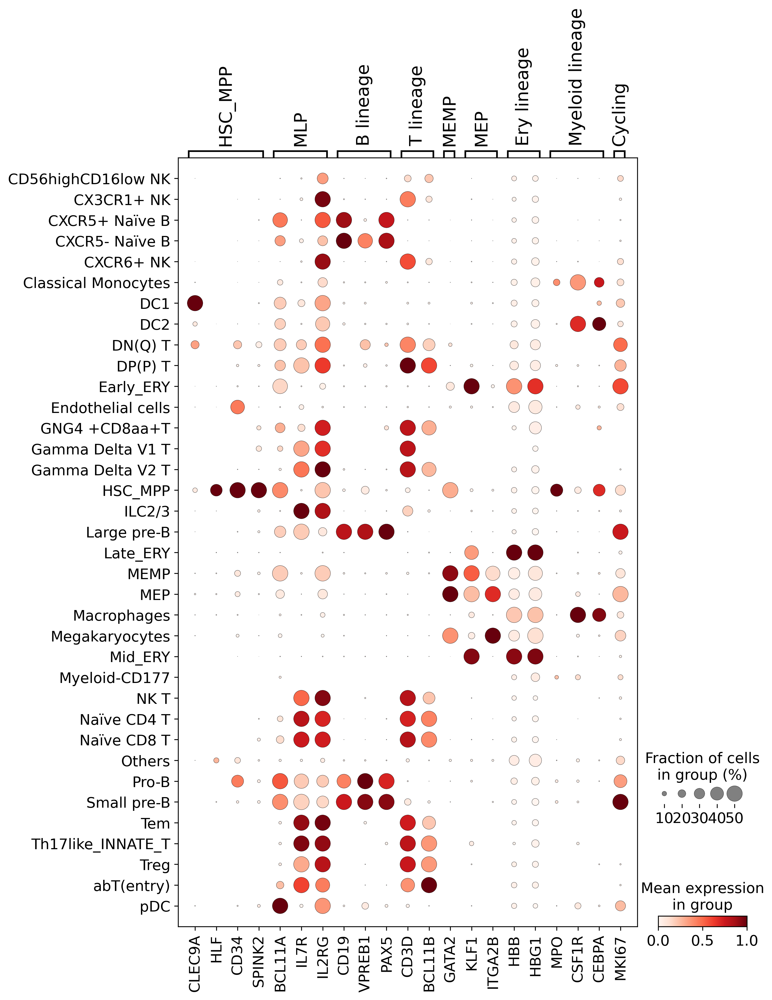

In [30]:

custom_fontsize = 16


custom_rc = {
    'font.size': custom_fontsize,
    'axes.titlesize': custom_fontsize,
    'axes.labelsize': custom_fontsize,
    'xtick.labelsize': custom_fontsize,
    'ytick.labelsize': custom_fontsize,
}


with plt.rc_context(rc=custom_rc):

    sc.pl.dotplot(adataLiver ,progenitor_gene,'Last_cell_type',dot_max=0.5,standard_scale='var')

In [31]:
TRDV=adata1[adata1.obs.Last_cell_type.isin(['Gamma Delta V1 T','Gamma Delta V2 T'])]

In [32]:
TRDV.obs['TCRBCRlabel'].value_counts()

None    2201
BCR        1
Name: TCRBCRlabel, dtype: int64

In [33]:
Tcell_markers = {'DN(early)':['IGLL1','ST18'],
           'DN(P)':['TRGC2','TRDC','HIVEP3'],
           'DN(Q)':['RAG1','RAG2','TP53INP1','PTCRA','RGPD3'],
           'DP(P)':['SMPD3'], 
           'DP(Q)':['AQP3','RORC'], 
           'abT(entry)':['CCR9','SATB1','TOX2'], 
           'MATURE_T':['CCR7','CD5','CD27','CD8A','CD8B','CD4'], 
           #'agonist selection':['TNFRSF9','CD27','IKZF2','IKZF3'],
           'Treg':['FOXP3','CTLA4'], 
           'CD8aa':['PDCD1','GNG4','ZNF683'], 
           'innate':['KLRB1','ZBTB16'],
           'TYPE_3_INNATE_T':['CD40LG','RORC','CCR6','ANXA1'],
           'ILC3': ['RORC','IL1R1','IL23R','KIT'],
           'ILC2':['PTGDR2','HPGDS','GATA3'],
           'TYPE_1_INNATE_T':['NKG7','EOMES','TBX21','IFNG-AS1'],
           'NK': ['KLRD1','KLRF1','NKG7','NCAM1'],
            'TRDV1':['TRDV1','TRGC1','TRGC2','TRGV9'],
                  'TRDV2':['TRDV2','TRGC1','TRGC2','TRGV9'],
                 
           'CYCLING':['MKI67'],
          }


/data1/maolp/mamba/envs/Pyscan/lib/python3.9/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


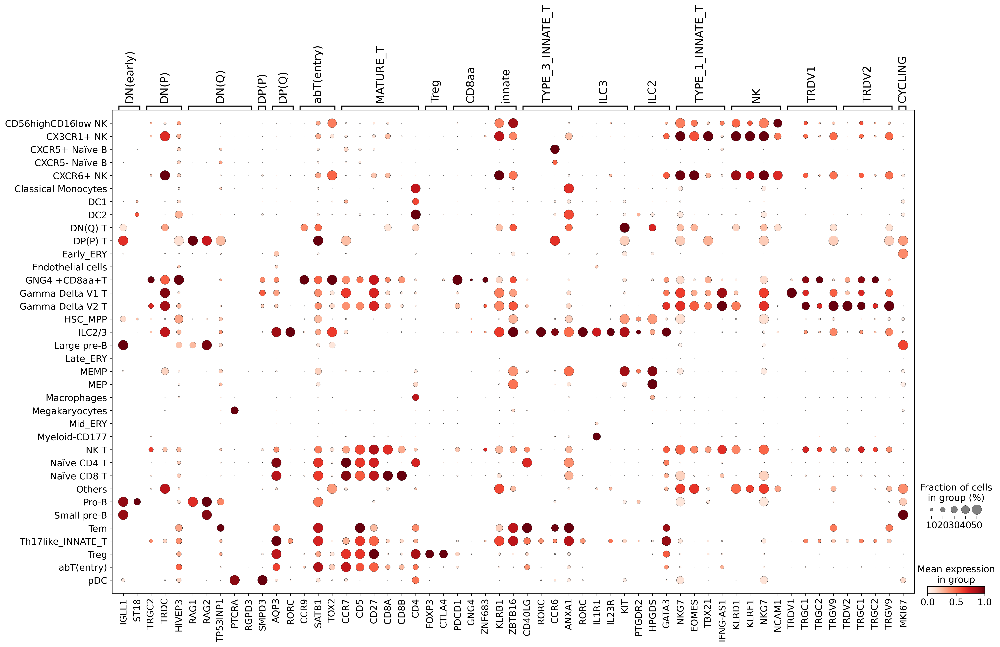

In [34]:

custom_fontsize = 16


custom_rc = {
    'font.size': custom_fontsize,
    'axes.titlesize': custom_fontsize,
    'axes.labelsize': custom_fontsize,
    'xtick.labelsize': custom_fontsize,
    'ytick.labelsize': custom_fontsize,
}


with plt.rc_context(rc=custom_rc):

    sc.pl.dotplot(adataSpleen ,Tcell_markers,'Last_cell_type',dot_max=0.5,standard_scale='var')

/data1/maolp/mamba/envs/Pyscan/lib/python3.9/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


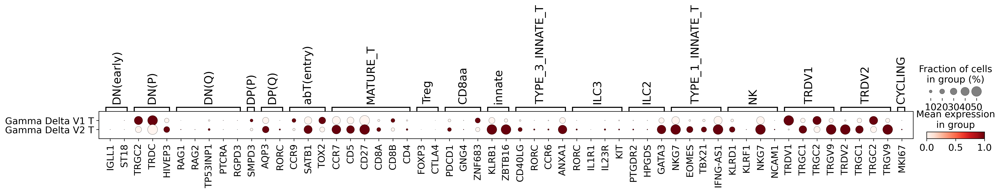

In [35]:

custom_fontsize = 16


custom_rc = {
    'font.size': custom_fontsize,
    'axes.titlesize': custom_fontsize,
    'axes.labelsize': custom_fontsize,
    'xtick.labelsize': custom_fontsize,
    'ytick.labelsize': custom_fontsize,
}


with plt.rc_context(rc=custom_rc):

    sc.pl.dotplot(TRDV ,Tcell_markers,'Last_cell_type',dot_max=0.5,standard_scale='var')

In [36]:
Bcell_type_genes = {
    "HSC_MPP": ["CLEC9A", "CD34", "SPINK2", "KIT", "FLT3"],
    "CMP": ["CD34", "SPINK2", "MPO", "CSF1R", "KIT", "FLT3"],
    "ELP": ["CD34", "SPINK2", "IL7R", "KIT", "FLT3"],
    "PRE PRO B CELL": ["FLT3", "CD19", "VPREB1", "RAG1", "MS4A1"],
    "PRO B CELL": ["CD19", "VPREB1", "MME", "CDC45", "DHFR", "MKI67", "RAG1", "DNTT", "CD24", "MME", "IDH2"],
    "LATE PRO B CELL": ["CD19", "VPREB1", "MME", "DHFR", "MKI67", "RAG1", "DNTT", "CD24", "MME"],
    "PRO TO PRE B CELL": ["CD19", "VPREB1", "MME", "CDC45", "DHFR", "MKI67", "MS4A1", "CD24", "MME", "IDH2"],
    "LARGE PRE B CELL": ["CD19", "VPREB1", "MME", "CDC45", "DHFR", "MKI67", "RAG1", "CD24", "TNFRSF17", "MME"],
    "SMALL PRE B CELL": ["CD19", "VPREB1", "RAG1", "CD24", "TNFRSF17", "MME"],
    "IMMATURE B CELL": ["CD19", "MS4A1", "CD24", "SPIB", "CD40", "FCER2"],
    "MATURE B CELL": ["CD19", "MS4A1", "CD24", "CD40", "FCER2"],
    "CYCLING B/B1 CELL": ["CD19", "MKI67", "CD27", "MS4A1", "CD24", "CD5", "SPN", "CD40", "FCER2"],
    "PLASMA B CELL": ["CD19", "CD27", "MS4A1", "CD24", "TNFRSF17", "CD40", "FCER2", "JCHAIN", "SDC1", "CD38"]
}

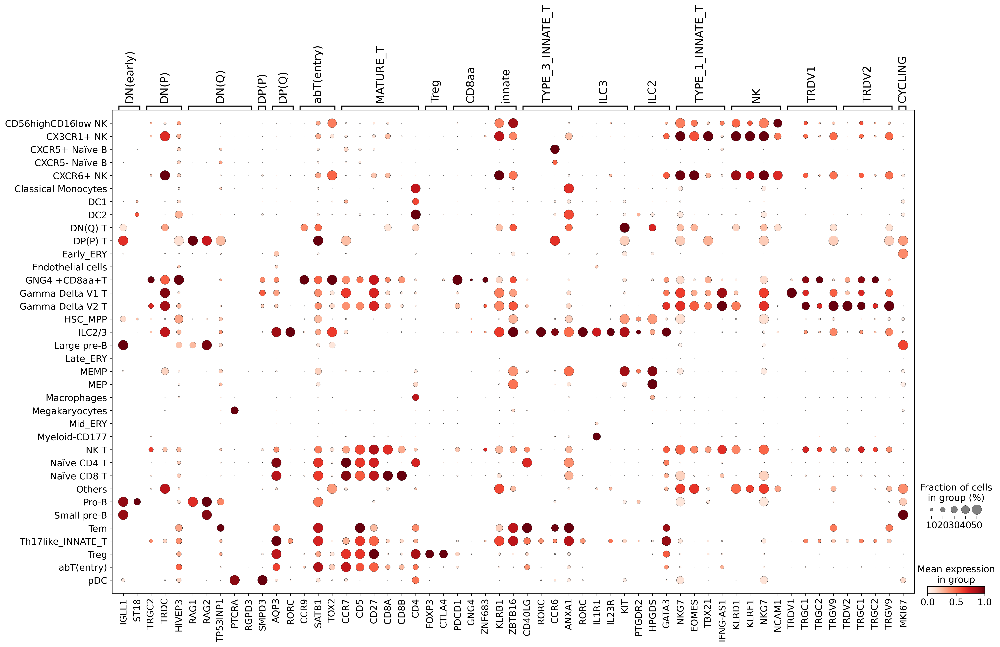

In [37]:

custom_fontsize = 16


custom_rc = {
    'font.size': custom_fontsize,
    'axes.titlesize': custom_fontsize,
    'axes.labelsize': custom_fontsize,
    'xtick.labelsize': custom_fontsize,
    'ytick.labelsize': custom_fontsize,
}


with plt.rc_context(rc=custom_rc):

    sc.pl.dotplot(adataSpleen,Tcell_markers,'Last_cell_type',dot_max=0.5,standard_scale='var')

In [38]:
MEGA_ER_markers = {"Megakaryocyte Erythroid Precursors":['TESPA1','GATA2','FCER1A'],
"Early_ERY":['KLF1','APOE','FAM178B'],
"Mid_ERY":[ 'BLVRB', 'CD36', 'OAT',],
"Late_ERY":[ 'GYPA', 'GYPB', 'SLC4A1'],
"YS_ERY" : ['HBZ','HBE1'],
"Early_MK":['HBD','PF4'],
"late_MK":['ITGA2B','ITGB3','CLK1'],
'MACROPHAGE_ERY':["C1QA","CD163"],
"Proliferating" : ["TOP2A","MKI67"],
          }


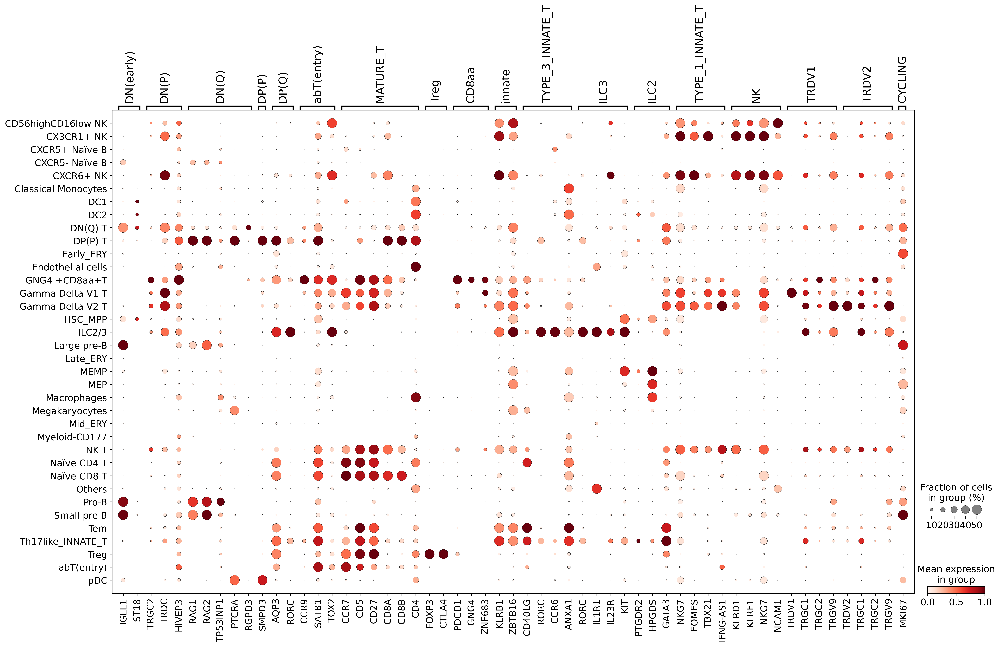

In [39]:

custom_fontsize = 16


custom_rc = {
    'font.size': custom_fontsize,
    'axes.titlesize': custom_fontsize,
    'axes.labelsize': custom_fontsize,
    'xtick.labelsize': custom_fontsize,
    'ytick.labelsize': custom_fontsize,
}


with plt.rc_context(rc=custom_rc):

    sc.pl.dotplot(adataLiver,Tcell_markers,'Last_cell_type',dot_max=0.5,standard_scale='var')

/data1/maolp/mamba/envs/Pyscan/lib/python3.9/site-packages/scanpy/plotting/_dotplot.py:772: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  dot_ax.set_ylim(dot_color.shape[0], 0)


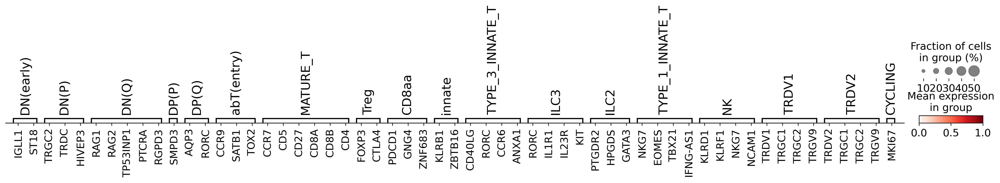

In [45]:

custom_fontsize = 16


custom_rc = {
    'font.size': custom_fontsize,
    'axes.titlesize': custom_fontsize,
    'axes.labelsize': custom_fontsize,
    'xtick.labelsize': custom_fontsize,
    'ytick.labelsize': custom_fontsize,
}


with plt.rc_context(rc=custom_rc):

    sc.pl.dotplot(TRDVTCR  ,Tcell_markers,'Last_cell_type',dot_max=0.5,standard_scale='var')

In [ ]:
adata1.uns['log1p']["base"] = None

In [46]:
cols01 = ["#f49128", "#194a55", "#187c65", "#f26115", "#c29f62", "#83ba9e"]
cols02 = ["#c62d17", "#023f75", "#ea894e", "#266b69", "#eb4601", "#f6c619"]
cols03 = ["#fa6e01", "#2f2f2f", "#972b1d", "#e6a84b", "#4c211b", "#ff717f"]
cols04 = ["#223e9c", "#b12b23", "#aebea6", "#edae11", "#0f6657", "#c74732"]
cols05 = ["#6a73cf", "#edd064", "#0eb0c8", "#f2ccac", "#a1d5b9", "#e1abbc"]

all_colors = cols01 + cols02 + cols03 + cols04 + cols05

colorname2 = [
    "#46A040", "#00AF99", "#FFC179", "#98D9E9", "#F6313E", "#FFA300", "#333366",
    "#FF5A00", "#663366", "#FF6666", "#8F1336", "#0081C9", "#001588", "#CC0033",
    "#CC9966", "#CC0033", "#999933", "#009966", "#CCCC33", "#CCFF99", "#333399",
    "#993333", "#490C65", "#BA7FD0", "#A6CEE3", "#1F78B4", "#DE77AE", "#B2DF8A",
    "#006D2C", "#868686", "#B5AD64", "#9DA8E2", "#91C392", "#FF9900", "#339966"
] + all_colors

colorname3 = colorname2[:]



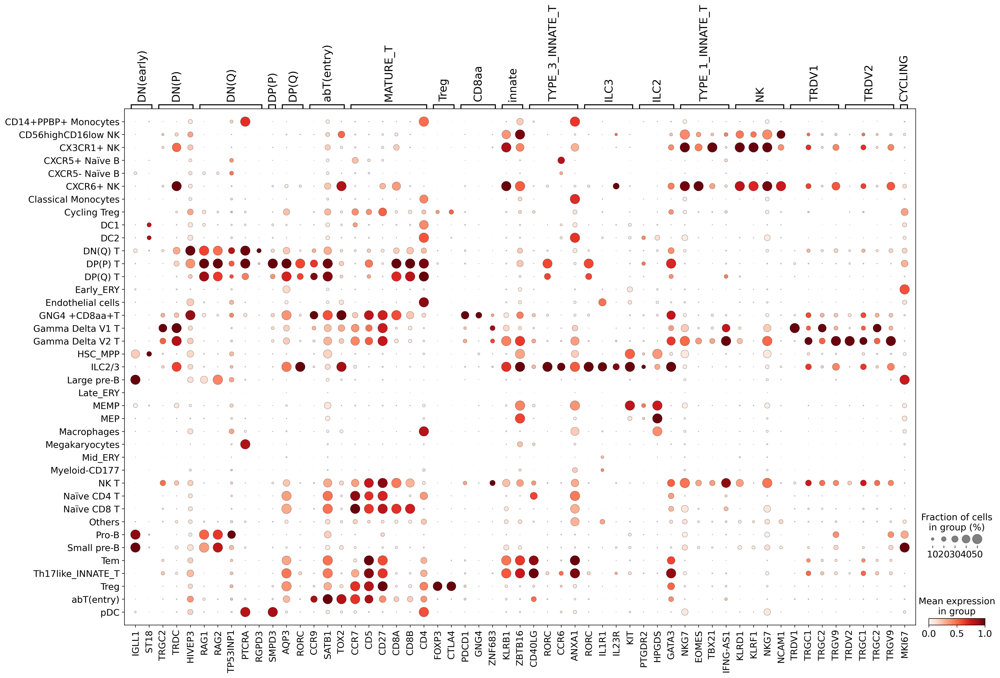

In [47]:

custom_fontsize = 16


custom_rc = {
    'font.size': custom_fontsize,
    'axes.titlesize': custom_fontsize,
    'axes.labelsize': custom_fontsize,
    'xtick.labelsize': custom_fontsize,
    'ytick.labelsize': custom_fontsize,
}


with plt.rc_context(rc=custom_rc):

    sc.pl.dotplot(adata1 ,Tcell_markers,'Last_cell_type',dot_max=0.5,standard_scale='var')